In [1]:
## Preliminaries

using Pkg
Pkg.activate(joinpath(@__DIR__, ".."))

using AdvancedHMC
using ArviZ
using BumpCosmologyGWTC3
using CairoMakie
using Colors
using Cosmology
using DataFrames
using DimensionalData
using Distributions
using GaussianKDEs
using HDF5
using InferenceObjects
#using Interpolations
using JSON
using LaTeXStrings
using MCMCChainsStorage
using NCDatasets
using PairPlots
using PolyLog
using PopModels
using Printf
using ProgressLogging
using Random
using StatsBase
using SpecialFunctions
using StatsFuns
using Trapz
using Turing
using Unitful
using UnitfulAstro
using UnitfulChainRules

include("plots.jl")

  Activating project at `~/GWTC4_35_m1m2z/correlated_pairing/m2_peak`


h_plot (generic function with 1 method)

# Plot Specification

In [2]:
## Set up paths

## Output Directory for Plots and Astro Comparison Plot
outdir = "../figures"

## Plot Specifications
xlabelsize = 30
ylabelsize = 30
xticklabelsize = 23
yticklabelsize = 23
titlesize = 35
draws = 500

plot_save = true

true

# $p_{cut} = 0.5$

In [3]:
trace_samples_0p5 = from_netcdf(joinpath(@__DIR__, "..", "data", "chains_0.5.nc"))
ne_min = dropdims(minimum(trace_samples_0p5.posterior.Neff_samps, dims=(:chain, :draw)); dims=(:chain, :draw))
ns_min = minimum(trace_samples_0p5.posterior.Neff_sel)
@info "p_cut = 0.5, minimum Neff_samps: $(round(minimum(ne_min), digits=2)), minimum Neff_sel = $(round(ns_min, digits=1)), 4*Nobs = $(4*length(dims(trace_samples_0p5.posterior, :event)))"
trace = trace_samples_0p5

┌ Info: p_cut = 0.5, minimum Neff_samps: 4.04, minimum Neff_sel = 829.5, 4*Nobs = 460
└ @ Main /mnt/home/sroy1/GWTC4_35_m1m2z/correlated_pairing/m2_peak/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W4sdnNjb2RlLXJlbW90ZQ==.jl:4


InferenceData with groups:
  > posterior
  > sample_stats

## Corner Plot

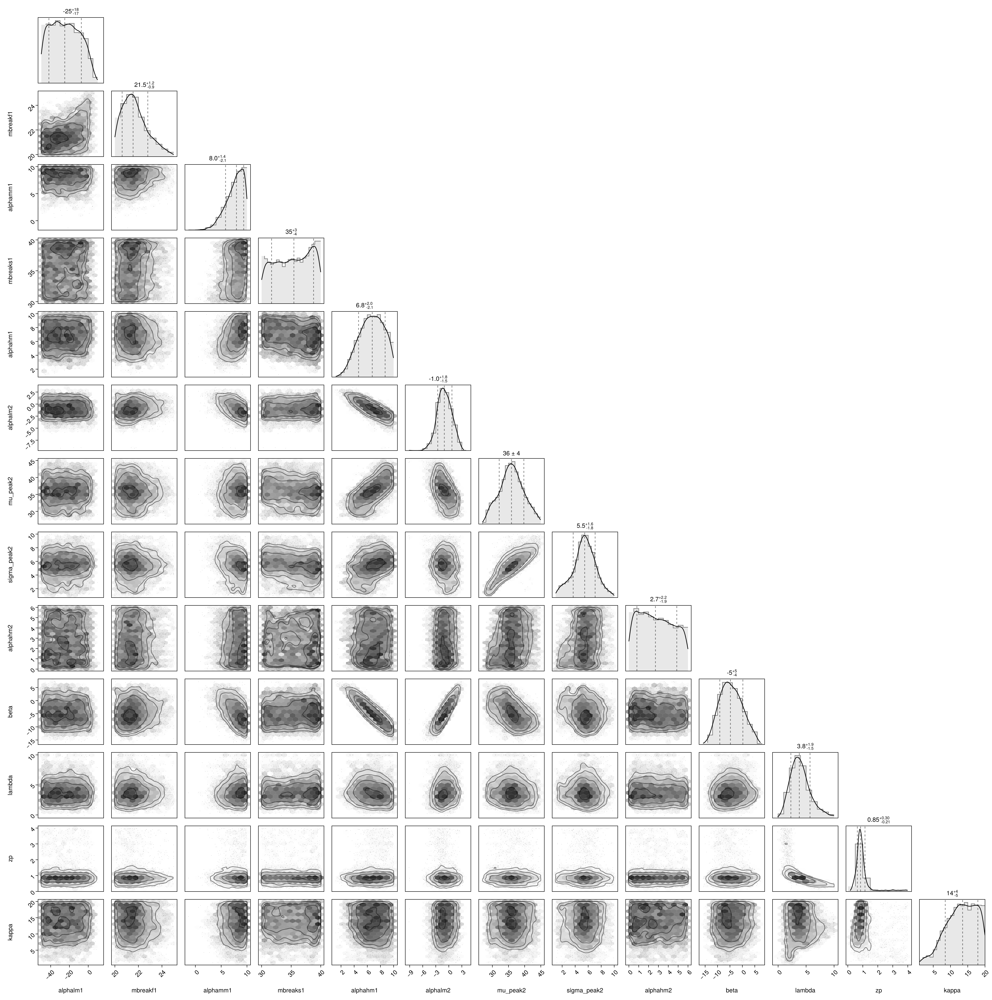

CairoMakie.Screen{IMAGE}


In [4]:
using DataFrames
using PairPlots
using CairoMakie

alphalm1_samples = vec(trace[:posterior][:alphalm1])
mbreakf1_samples = vec(trace[:posterior][:mbreakf1])
alphamm1_samples = vec(trace[:posterior][:alphamm1])
mbreaks1_samples = vec(trace[:posterior][:mbreaks1])
alphahm1_samples = vec(trace[:posterior][:alphahm1])
alphalm2_samples = vec(trace[:posterior][:alphalm2])
mu_peak2_samples = vec(trace[:posterior][:mu_peak2])
sigma_peak2_samples = vec(trace[:posterior][:sigma_peak2])
alphahm2_samples = vec(trace[:posterior][:alphahm2])
beta_samples = vec(trace[:posterior][:beta])
lambda_samples = vec(trace[:posterior][:lambda])
zp_samples = vec(trace[:posterior][:zp])
kappa_samples = vec(trace[:posterior][:kappa])

df = DataFrame(
    alphalm1 = alphalm1_samples,
    mbreakf1 = mbreakf1_samples,
    alphamm1 = alphamm1_samples,
    mbreaks1 = mbreaks1_samples,
    alphahm1 = alphahm1_samples,
    alphalm2 = alphalm2_samples,
    mu_peak2 = mu_peak2_samples,
    sigma_peak2 = sigma_peak2_samples,
    alphahm2 = alphahm2_samples,
    beta = beta_samples,
    lambda = lambda_samples,
    zp = zp_samples,
    kappa = kappa_samples
)

fig = PairPlots.pairplot(df)

display(fig)

## $m_1$ Marginal

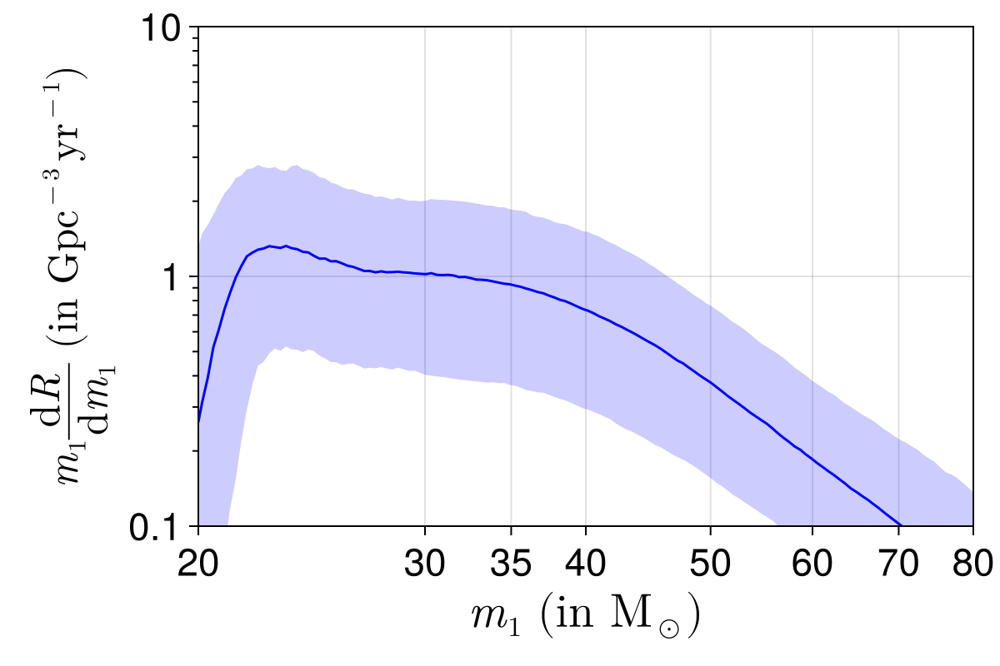

In [5]:
z_plot = 0.0
function marginal_m1_plot_paper(trace; limits=(20.0, 80.0, 0.1, 10.0), yticks=[0.01, 0.1, 1, 10, 100], yminorticks=[0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,2,3,4,5,6,7,8,9,20], kwargs...)
    f = Figure(size=(600, 400))
    a = Axis(f[1,1],
    xlabel = L"m_1~(\mathrm{in~}\mathrm{M}_\odot)",
    ylabel = L"m_1 \frac{\mathrm{d} R}{\mathrm{d} m_1}~(\mathrm{in~}\mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1})",
    xscale = log10, yscale = log10,
    xticks = [20, 30, 35, 40, 50, 60, 70, 80], xtickformat = "{:.0f}",
    yticks = ([0.01, 0.1, 1.0, 10.0, 100.0], ["0.01", "0.1", "1", "10", "100"]),
    yminorticks = yminorticks, yminorticksvisible = true,
    xlabelsize = 28,
    ylabelsize = 25,
    xticklabelsize = xticklabelsize,
    yticklabelsize = yticklabelsize,
    limits = limits)

    marginal_m1_plot_paper!(a, trace; kwargs...)

    # axislegend(a, position = :lb, labelsize = 21, framevisible = true)  # top-right inside the plot

    f
end


function marginal_m1_plot_paper!(a, trace; z_plot=z_plot, ms=exp.(log(m_bh_min):0.01:log(m_bh_max)), qs=0.001:0.01:1, draws=1000, rng=Random.default_rng(), color=Makie.wong_colors()[1], label="Median")
    p = trace.posterior
    dNdm1_matrix = zeros(length(ms), draws)

    @progress for i in 1:draws
        d = rand(rng, span(dims(p, :draw)))
        c = rand(rng, 1:length(dims(p, :chain)))
        log_dN = log_dN_from_chain_sample(trace, d, c)

        dNdm1 = map(ms) do m
            integrand = map(qs) do q
                m2 = q * m
                if m2 < m_bh_min
                    zero(m)
                else
                    exp(log_dN(m, q, z_plot))
                end
            end
            m * p.R[chain=c, draw=d] * trapz(qs, integrand)
        end

        dNdm1_matrix[:, i] = dNdm1
    end

    q5 = mapslices(x -> quantile(x, 0.05), dNdm1_matrix; dims=2)[:]
    q50 = mapslices(x -> quantile(x, 0.50), dNdm1_matrix; dims=2)[:]
    q95 = mapslices(x -> quantile(x, 0.95), dNdm1_matrix; dims=2)[:]

    band!(a, ms, q5, q95, color=(:blue, 0.2), label=L"\mathrm{This~Work}: 35\,\mathrm{M}_{\odot} \mathrm{Pop}")
    lines!(a, ms, q50, color=:blue)
    
end

f = marginal_m1_plot_paper(trace)
f

## Marginal $q$

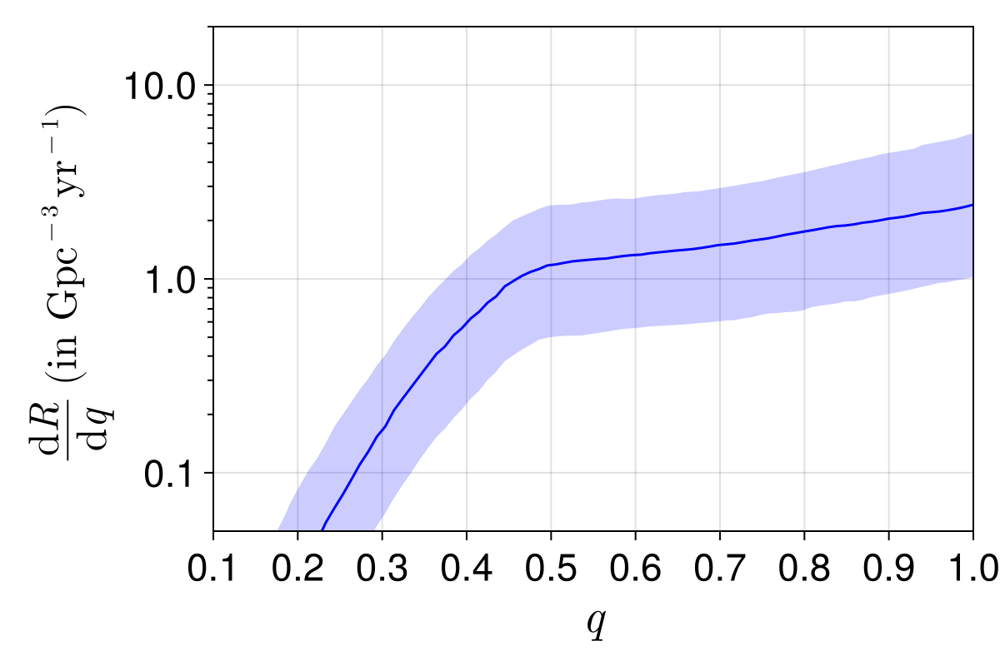

In [6]:
z_plot = 0.0
function marginal_q_plot_paper(trace; z_plot=z_plot, ms=exp.(log(m_bh_min):0.01:log(m_bh_max)), qs=collect(range(0.001, stop=1.0, length=100)), draws=draws, rng=Random.default_rng(), limits=(0.1, 1, 0.05, 20), yticks=[0.1, 1, 10, 100, 1000, 10000], yminorticks=[0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,2,3,4,5,6,7,8,9,20,30,40,50,60,70,80,90,200,300,400,500,600,700,800,900,2000,3000,4000,5000,6000,7000,8000,9000], color=Makie.wong_colors()[1])
    
    f = Figure(size=(600, 400))
    
    a = Axis(f[1,1],
        xlabel = L"q",
        ylabel = L"\frac{\mathrm{d} R}{\mathrm{d} q}~(\mathrm{in~}\mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1})",
        yscale = log10,
        yticks = yticks,
        yminorticks = yminorticks,
        yminorticksvisible = true,
        ytickformat = "{:.1f}",
        xlabelsize = 28,
        ylabelsize = 25,
        xticklabelsize = xticklabelsize,
        yticklabelsize = yticklabelsize,
        limits = limits
    )

    p = trace.posterior
    dNdq_matrix = zeros(length(qs), draws)

    @progress for i in 1:draws
        d = rand(rng, span(dims(p, :draw)))
        c = rand(rng, span(dims(p, :chain)))
        log_dN = log_dN_from_chain_sample(trace, d, c)

        dNdq = map(qs) do q
            integrand = map(ms) do m
                m2 = q * m
                if m2 < m_bh_min
                    zero(m)
                else
                    exp(log_dN(m, q, z_plot))
                end
            end
            p.R[chain=c, draw=d] * trapz(ms, integrand)
        end

        dNdq_matrix[:, i] = dNdq
    end

    # Compute quantiles
    q5 = mapslices(x -> quantile(x, 0.05), dNdq_matrix; dims=2)[:]
    q50 = mapslices(x -> quantile(x, 0.50), dNdq_matrix; dims=2)[:]
    q95 = mapslices(x -> quantile(x, 0.95), dNdq_matrix; dims=2)[:]

    band!(a, qs, q5, q95, color=(:blue, 0.2), label=L"\mathrm{This~Work}: 35\,\mathrm{M}_{\odot} \mathrm{Pop}")
    lines!(a, qs, q50, color=:blue)
    
    return f

end

f = marginal_q_plot_paper(trace)
f


## Marginal $z$

imin = 32


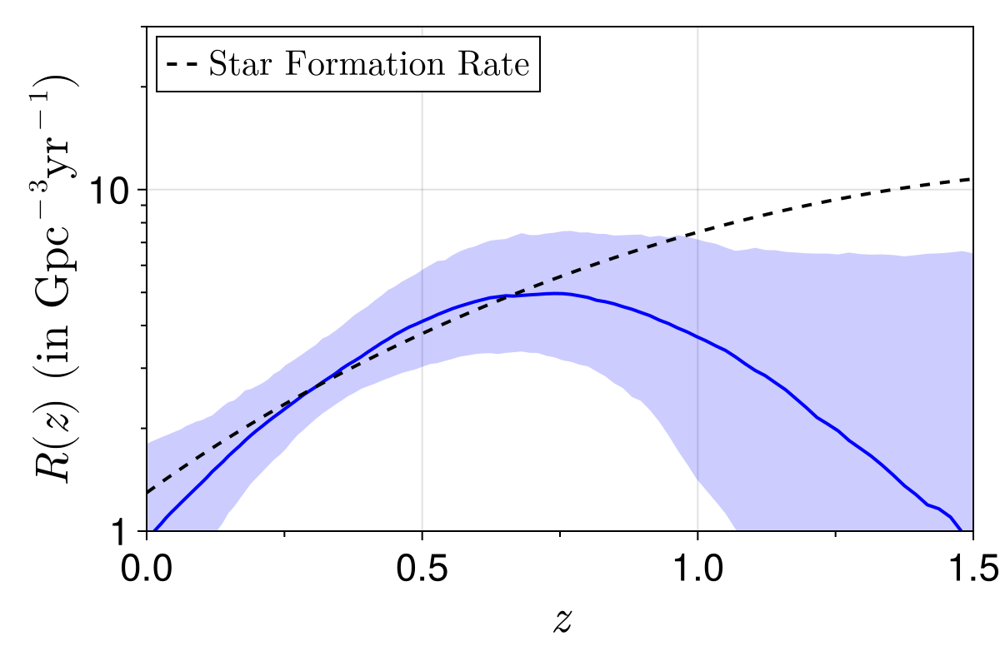

In [7]:
function marginal_z_plot_paper(trace;
    ms = exp.(log(m_bh_min):0.01:log(m_bh_max)),
    qs = 0.001:0.01:1,
    zs = expm1.(range(log(1), stop=log(1 + 2), length=128)),
    draws = draws,
    rng = Random.default_rng(),
    limits = (0, 1.5, 1, 30),
    yticks = [1, 10, 100, 1000],
    yminorticks = [2,3,4,5,6,7,8,9,20,30,40,50,60,70,80,90,200,300,400,500,600,700,800,900],
    plot_md_line = true,
    color = Makie.wong_colors()[1]
)
    f = Figure(size=(600, 400))
    a = Axis(f[1, 1],
        xlabel = L"z",
        ylabel = L"R(z)~(\mathrm{in~}\mathrm{Gpc}^{-3}\mathrm{yr}^{-1})",
        yscale = log10,
        xlabelsize = 28,
        ylabelsize = 28,
        xticklabelsize = xticklabelsize,
        yticklabelsize = yticklabelsize,
        ytickformat = "{:.0f}",
        yticks = yticks,
        yminorticks = yminorticks,
        yminorticksvisible = true,
        xminorticksvisible = true,
        limits = limits
    )

    p = trace.posterior
    dNs = zeros(length(zs), draws)

    @progress for j in 1:draws
        c = rand(rng, span(dims(p, :chain)))
        d = rand(rng, span(dims(p, :draw)))
        log_dN = log_dN_from_chain_sample(trace, d, c)

        z1 = zs[1]
        dNdms = map(ms) do m
            integrand = map(qs) do q
                m2 = q * m
                if m2 < m_bh_min
                    zero(m)
                else
                    exp(log_dN(m, q, z1))
                end
            end
            trapz(qs, integrand)
        end

        norm = trace.posterior.R[draw=d, chain=c] *
               trapz(ms, dNdms) /
               exp(log_dN(m_plot, q_plot, z1))

        dNdz = map(zs) do z
            norm * exp(log_dN(m_plot, q_plot, z))
        end

        dNs[:, j] = dNdz
    end

    #imin = argmin(Rz_95 - Rz_5)
    vs = vec(var(log.(dNs), dims=2))
    imin = argmin(vs)
    @show imin
    
    medians = mapslices(median, dNs; dims=2)[:]
    lowers = mapslices(x -> quantile(x, 0.05), dNs; dims=2)[:]
    uppers = mapslices(x -> quantile(x, 0.95), dNs; dims=2)[:]
    norm = medians[imin]


    band_plot = band!(a, zs, lowers, uppers, color=(:blue, 0.2))
    median_plot = lines!(a, zs, medians, color=:blue, linewidth=2)

    sfr_plot = nothing
    if plot_md_line
        mds = @. (1 + zs)^2.7 / (1 + ((1 + zs)/(1 + 1.9))^5.6)
        mds = mds .* norm ./ mds[imin]

        sfr_plot = lines!(a, zs, mds, color=:black, linestyle=:dash, linewidth=2, label=L"\mathrm{Star~Formation~Rate}")
    end

    axislegend(a, position = :lt, labelsize = 21, framevisible = true)
    
    return f
end

f = marginal_z_plot_paper(trace)
f

## Print Median, 5% and 95% Values

In [8]:
function summarize_trace(trace)
    println("Parameter\tMedian\t5%\t95%")
    for (name, values) in pairs(trace.posterior)
        flat_values = vec(Array(values))  # Flatten all chains and draws into a 1D array
        median_val = median(flat_values)
        lower_val = quantile(flat_values, 0.05)
        upper_val = quantile(flat_values, 0.95)
        println("$(name)\t$(round(median_val, sigdigits=5))\t$(round(median_val-lower_val, sigdigits=5))\t$(round(upper_val-median_val, sigdigits=5))")
    end
end

summarize_trace (generic function with 1 method)

In [9]:
summarize_trace(trace)

Parameter	Median	5%	95%
mbreakf1	21.549	1.3412	2.2383
sigma_peak2	5.4622	3.3037	2.8032
alphahm2	2.698	2.4259	2.9356
m1_draw	37.393	14.567	28.25
alphalm2	-1.0267	2.6121	2.7658
Neff_samps	34.383	21.412	98.781
log_rlm2	-3.4538	1.0268	1.7192
alphahm1	6.7535	3.2288	2.7801
lambda	3.7881	2.3073	3.7299
m2s	29.499	17.179	11.98
qs	0.78494	0.37023	0.19108
kappa	13.512	7.9418	5.7891
alphalm1	-25.017	22.451	25.104
rlm2	0.031625	0.020298	0.14484
mbreaks1	35.46	4.9764	4.1739
R	12.953	12.254	64.37
m1s	36.661	14.072	33.328
rhm2	0.08928	0.07633	0.33956
alphamm1	7.9642	3.5963	1.8432
Neff_sel	2070.7	775.64	522.23
q_draw	0.79226	0.39763	0.18501
log_rhm2	-2.416	1.9307	1.5693
beta	-4.807	6.6403	8.0204
zs	0.45234	0.30454	0.47508
m2_draw	29.545	15.354	12.217
z_draw	0.45619	0.31996	0.52365
zp	0.85135	0.40002	1.7094
mu_peak2	35.919	6.3772	6.4666
